# ESO 137-002

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

import glob
import sys, os
sys.path.append(os.path.expanduser('~/Desktop/Pangal'))

from pangal.pangal import PanGal
from pangal.region import Region
from pangal.plot import Point, Contours
from pangal.photometry_table import PhotometryTable, PhotometryCatalog

import warnings
warnings.simplefilter("ignore")



In [2]:
directory = '../DATA/Norma/ESO137_002/FITS_OBS/'
muse_file =  glob.glob(directory+'*muse*.fits')
spitzer_files = glob.glob(directory+'*spitzer_*.fits')
sdss_files = glob.glob(directory+'*sdss*.fits')
hershel_files = glob.glob(directory+'*hpacs*.fits')
twomass_files = glob.glob(directory+'*2mass*.fits')
hst_files = glob.glob(directory+'*hst*.fits')
galex_files = glob.glob(directory+'*nuv*.fits')
wise_files = glob.glob(directory+'*WISE*.fits')

files_list =  galex_files + sdss_files + twomass_files + spitzer_files + hershel_files + muse_file + hst_files + wise_files

for f in files_list:
    print(f)

../DATA/Norma/ESO137_002/FITS_OBS/galex_nuv.fits
../DATA/Norma/ESO137_002/FITS_OBS/2mass_j.fits
../DATA/Norma/ESO137_002/FITS_OBS/2mass_k.fits
../DATA/Norma/ESO137_002/FITS_OBS/2mass_h.fits
../DATA/Norma/ESO137_002/FITS_OBS/hpacs_70.fits
../DATA/Norma/ESO137_002/FITS_OBS/hpacs_160.fits
../DATA/Norma/ESO137_002/FITS_OBS/hpacs_100.fits
../DATA/Norma/ESO137_002/FITS_OBS/eso137_002_muse.fits
../DATA/Norma/ESO137_002/FITS_OBS/hst_2.fits
../DATA/Norma/ESO137_002/FITS_OBS/hst_4.fits
../DATA/Norma/ESO137_002/FITS_OBS/hst_3.fits
../DATA/Norma/ESO137_002/FITS_OBS/hst_1.fits
../DATA/Norma/ESO137_002/FITS_OBS/WISE_2430m606_ac51-w2-int-3_ra243.3988618_dec-60.8651721_asec600.000.fits
../DATA/Norma/ESO137_002/FITS_OBS/WISE_2430m606_ac51-w1-int-3_ra243.3988618_dec-60.8651721_asec600.000.fits
../DATA/Norma/ESO137_002/FITS_OBS/WISE_2430m606_ac51-w3-int-3_ra243.3988618_dec-60.8651721_asec600.000.fits
../DATA/Norma/ESO137_002/FITS_OBS/WISE_2430m606_ac51-w4-int-3_ra243.3988618_dec-60.8651721_asec600.000.fi

In [3]:
z_true =  0.018983   # NASA/IPAC Extragalactic Database
ra_center, dec_center = 243.39854583, -60.86516667

distance = 67.8 # Mpc


In [4]:
galaxy = PanGal(fits_files=files_list,target_coords = [ra_center,dec_center],fov=1/12,EBmV=0.1801,EBmV_err=0.0062,z=z_true)


Processing GALEX file:  ../DATA/Norma/ESO137_002/FITS_OBS/galex_nuv.fits
Processing 2MASS:  ../DATA/Norma/ESO137_002/FITS_OBS/2mass_j.fits
Processing 2MASS:  ../DATA/Norma/ESO137_002/FITS_OBS/2mass_k.fits
Processing 2MASS:  ../DATA/Norma/ESO137_002/FITS_OBS/2mass_h.fits
Processing Herschel PACS:  ../DATA/Norma/ESO137_002/FITS_OBS/hpacs_70.fits
Processing Herschel PACS:  ../DATA/Norma/ESO137_002/FITS_OBS/hpacs_160.fits
Processing Herschel PACS:  ../DATA/Norma/ESO137_002/FITS_OBS/hpacs_100.fits
Processing MUSE: ../DATA/Norma/ESO137_002/FITS_OBS/eso137_002_muse.fits
 Correcting for dust attenuation
 Building muse_blue image
 Building muse_green image
 Building muse_red image
 Building muse_nir image
 Building muse_white_aoe image
 Building Ha image
 Building Hb image
 Building [O III] 5007 image
 Building [S II] 6716 image
 Building He II 4686 image
Processing HST files:  ../DATA/Norma/ESO137_002/FITS_OBS/hst_2.fits
Processing HST files:  ../DATA/Norma/ESO137_002/FITS_OBS/hst_4.fits
Proce

In [15]:
# OFFSET BETWEEN MUSE and the other bands
galaxy.correct_coords_offset('muse', offset=(0.0,-0.00005)) #+0.0008 

muse_Ha CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRVAL: [243.397886, -60.863139999999994]
muse_He II 4686 CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRVAL: [243.397886, -60.863139999999994]
muse_Hb CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRVAL: [243.397886, -60.863139999999994]
muse_[S II] 6716 CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRVAL: [243.397886, -60.863139999999994]
muse_red CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRVAL: [243.397886, -60.863139999999994]
muse_[O III] 5007 CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRVAL: [243.397886, -60.863139999999994]
muse_blue CRVAL updated by offset (RA: 0.0 deg, Dec: -5e-05 deg). Old CRVAL: [243.397886 -60.86314 ] New CRV

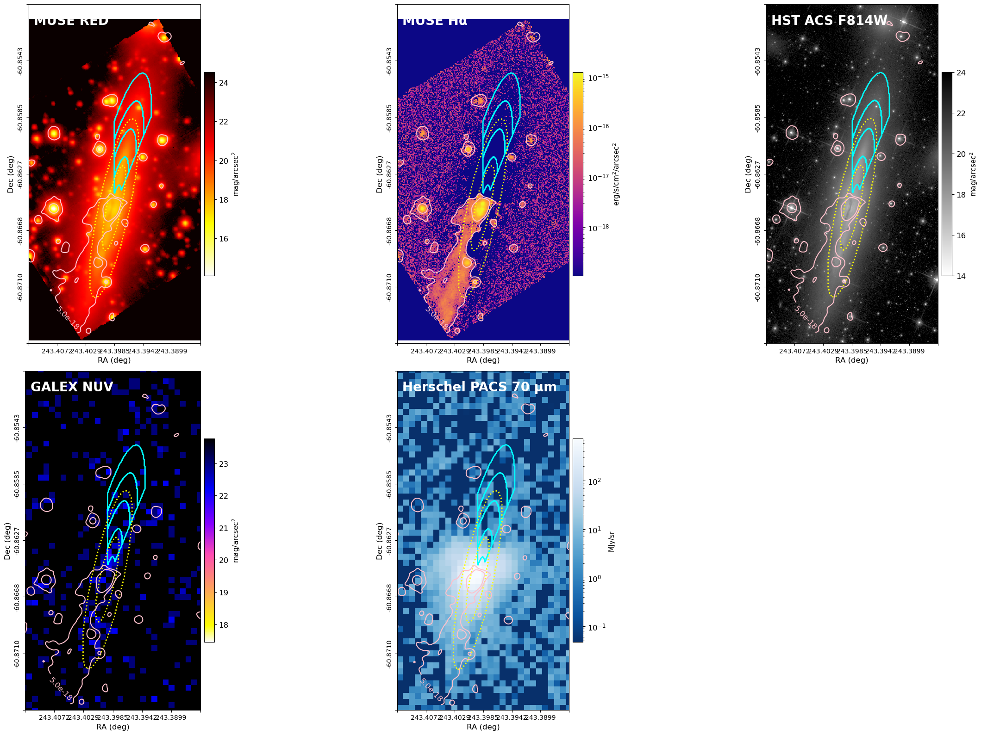

In [60]:
contours = [Contours(image=galaxy.images['muse_red'].mag_arcsec2,wcs=galaxy.images['muse_red'].wcs,levels=[22,23,24,25],
                     color='navy', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.0f',label='muse_red',), #target_bands=['muse_red']
           Contours(image=galaxy.images['muse_Ha'].erg_s_cm2_arcsec2,wcs=galaxy.images['muse_Ha'].wcs,levels=[5e-18,1e-16,1e-15],
                     color='pink', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.1e',label='Ha',)] #target_bands=['muse_Ha'] 

galaxy.plot( plots_per_row=3,
            
              bands=['muse_red','muse_Ha','hst_acs_f814w','galex_nuv','herschel_pacs_70um'],
              #figsize= (12,24),
              auto_titles=True,
              auto_titles_style=1,
              auto_title_fontsize=20,
              auto_title_color='white',
              ra_min = ra_center-0.013,
              ra_max = ra_center+0.013,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.015,
              regions= regions_for_mcspf + ellipses,
              contours=[contours[1]],
              set_scale_lims = {
                                'hst_acs_f475w':(20,26), 
                                'hst_wfc3_uvis_f275w':(20,26),
                                'hst_wfc3_ir_f160w':(16,24),
                                'hst_acs_f814w':(14,24),   
                  
                               },
              show_region_captions=False,
              legend=False
            )

In [57]:
muse_obj = galaxy.images['muse_red']

# Convert angular scale to physical scale
from astropy.cosmology import Planck18 as cosmo
z_Norma = 0.01570
D_A = cosmo.angular_diameter_distance(z_Norma).to('pc').value
theta_deg_1kpc = 1e3 / D_A / (np.pi / 180)               # Convert 1 kpc in deg
theta_arcsec_1kpc = 1e3 / D_A / (np.pi / 648000)         # Convert 1 kpc in arcsec
npix_1kpc = theta_deg_1kpc /  muse_obj.dtheta_pix_deg     # number of pixels corresponding to 1 kpc

image =  muse_obj.mag_arcsec2

dr_pix = 4 * npix_1kpc

angle = 78
axis_ratio = 0.17
m_semimajor_ax = np.tan(angle*np.pi/180)
x_center, y_center =  muse_obj.wcs.all_world2pix([[ra_center,dec_center]],1)[0] 


#stars_coords = [(225,241),(235,237),(189,213),(250,242),(187,201),(243,215),(245,308),(268,301),(219,307),(225,276),(192,253),(209,318),(275,265)]
#radius = [5,5] + [7 for _ in range(8)] + [13,13,13]

"""
regions_for_mcspf = []

from regions import PixCoord, RectanglePixelRegion, EllipseAnnulusPixelRegion
from astropy import units as u

#[(220,197),(223,207),(225,217),(227,227),(232,250),(239,269),(241,288),(251,325)])
for i, (x, y) in enumerate([(223,207),(228,250),(241,288),(251,325)]):
    width = 30 # if i <4 else 20
    
    height = width

    if i ==7: width = 40
    
    region = RectanglePixelRegion(center=PixCoord(x, y), width=width, height=height)

    mask = np.zeros_like(image, dtype=bool)
    mask |= region.to_mask(mode='center').to_image(image.shape).astype(bool)

    ra,dec = muse_obj.wcs.all_pix2world([[x,y]],0)[0]
    
    regions_for_mcspf.append(Region(mask=mask,wcs= muse_obj.wcs, id=f"{i+1}",caption_coords=[ra,dec],))
"""

from regions import EllipseAnnulusPixelRegion, PixCoord
from astropy import units as u

# Elliptical regions
# Define the separator (regions must exclude Ha and Hb)
y_coords, x_coords = np.meshgrid(np.linspace(0,image.shape[0], image.shape[0]),np.linspace(0, image.shape[1], image.shape[1]),indexing='ij')
upper_line = (y_coords < np.tan(89.99*np.pi/180) * (x_coords - x_center) + y_center)
lower_line = (y_coords > np.tan(68*np.pi/180) * (x_coords - x_center) + y_center)


regions_for_mcspf = []
dr = 2.5
for i,r_kpc in enumerate(np.arange(2,10,dr)):

    region = EllipseAnnulusPixelRegion(
        center=PixCoord(x_center, y_center),
        inner_width = 2 * r_kpc * npix_1kpc, 
        outer_width = 2 * (r_kpc+dr) * npix_1kpc,  
        inner_height = axis_ratio * 2 * r_kpc * npix_1kpc,  
        outer_height = axis_ratio * 2 * (r_kpc+dr) * npix_1kpc,
        angle = angle*u.deg  
    )

    mask_elliptical_annulus = region.to_mask(mode='center').to_image(image.shape).astype(bool)
    mask = np.zeros_like(image, dtype=bool)
    mask |= (mask_elliptical_annulus & upper_line.astype(bool) & lower_line.astype(bool))
    

    if np.any(mask):

        R = r_kpc + 1
        print(f'Average galactocentric radius region {i+1:.0f} = {R:.2f} kpc')
        x_centroid = x_center + R * npix_1kpc * np.cos(angle*np.pi/180)
        y_centroid = m_semimajor_ax * (x_centroid - x_center) + y_center 
        ra,dec = muse_obj.wcs.all_pix2world([[x_centroid, y_centroid]], 0)[0]

        regions_for_mcspf.append(Region(mask=mask,wcs=muse_obj.wcs,caption_coords = [ra,dec],id=str(i+1)))



Average galactocentric radius region 1 = 3.00 kpc
Average galactocentric radius region 2 = 5.50 kpc
Average galactocentric radius region 3 = 8.00 kpc
Average galactocentric radius region 4 = 10.50 kpc


In [58]:
ellipses = []
for R in [3.80,8]:
    ellipses.append(
        Region.ellipse(
            id=f'IC 4040: R {R} kpc',
            ra_center=ra_center, dec_center=dec_center,
            semimajor_axis=R * theta_deg_1kpc,
            axis_ratio=axis_ratio, angle=angle,
            wcs=galaxy.images['muse_red'].wcs,
            image_shape=galaxy.images['muse_red'].mag_arcsec2.shape,
            linewidth=2, linestyle=':', color='yellow'
        )
    )

contours = [Contours(image=galaxy.images['muse_red'].mag_arcsec2,wcs=galaxy.images['muse_red'].wcs,levels=[22,23,24,25],
                     color='navy', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.0f',label='muse_red',), #target_bands=['muse_red']
           Contours(image=galaxy.images['muse_Ha'].erg_s_cm2_arcsec2,wcs=galaxy.images['muse_Ha'].wcs,levels=[5e-18,1e-16,1e-15],
                     color='pink', linewidth=1.5,clabel_fontsize=12,clabel_fmt='%.1e',label='Ha',)] #target_bands=['muse_Ha'] 


points=[Point(coords=(ra_center,dec_center),caption='ESO 137-002',caption_fontsize=14,caption_offset=[0.02,0.03],color='navy',)]

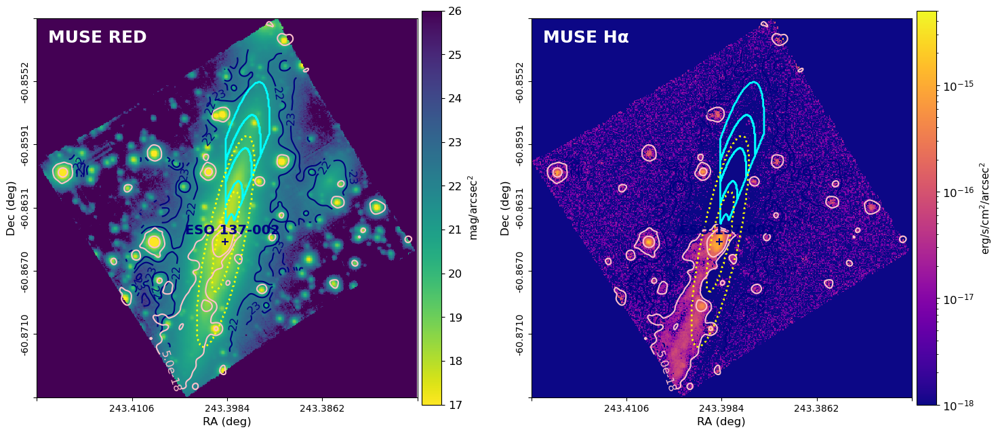

In [59]:

galaxy.plot( plots_per_row=2,
              
              bands=['muse_red','muse_Ha'],
              figsize= (15,10),
              auto_titles=True,
              auto_title_color='white',
              auto_title_fontsize=18,
                regions=regions_for_mcspf+ellipses, 
                contours=contours,
                points = points,
                set_scale_lims = {'muse_blue':(18,27),'muse_red':(17,26),'muse_Ha':(1e-18,5e-15)},
                set_cmaps = {'muse_red':'viridis','muse_Ha':'plasma',},
                legend=False,
                #n_yticks=3,
               show_region_captions=False,
                auto_titles_style=1,
                #interactive_pix_coords=True,
                n_xticks= 3,
                )

In [10]:
for b in ['hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w']:
    print(galaxy.images[b].exptime)

3030.0
1728.0
678.0
798.466308


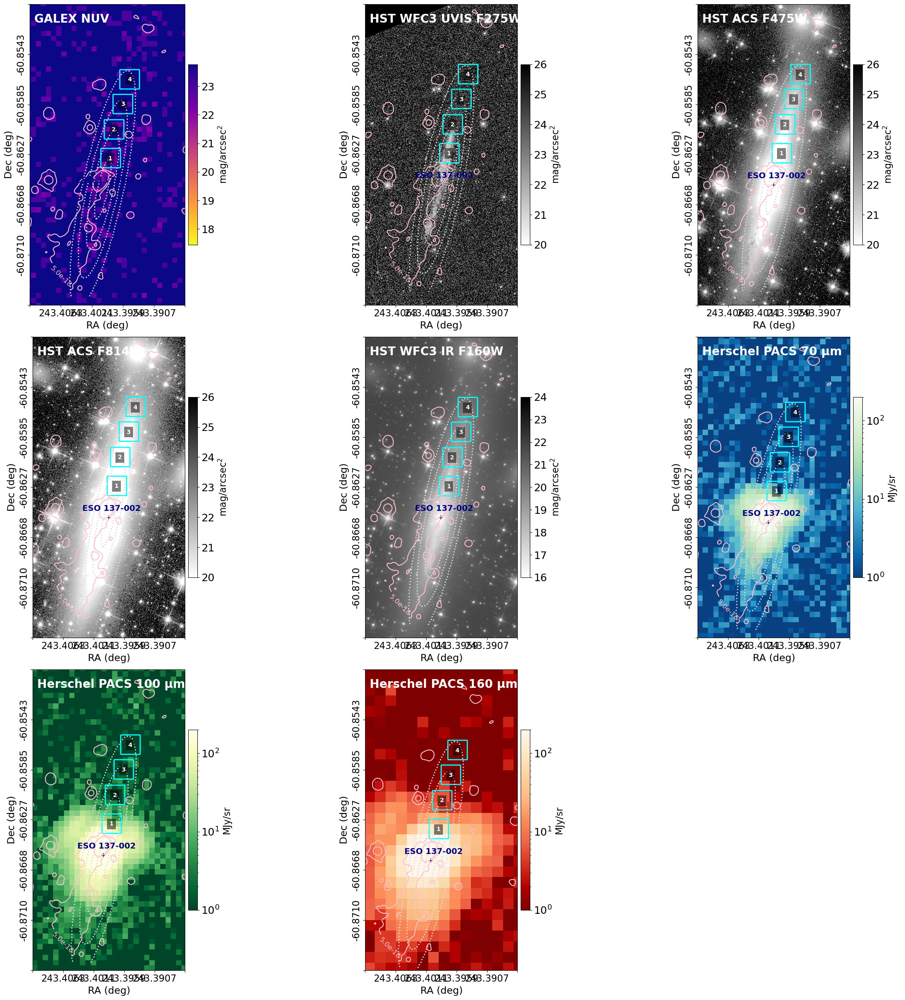

In [19]:
galaxy.plot( plots_per_row=3,
            
              bands=['galex_nuv','hst_wfc3_uvis_f275w','hst_acs_f475w','hst_acs_f814w','hst_wfc3_ir_f160w',
                     'herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
              #figsize= (12,24),
              auto_titles=True,
              auto_titles_style=1,
              auto_title_fontsize=20,
              auto_title_color='white',
              ra_min = ra_center-0.013,
              ra_max = ra_center+0.013,
              dec_min = dec_center-0.01,
              dec_max = dec_center+0.015,
              regions= regions_for_mcspf + ellipses,
              contours=[contours[1]],
              points = points,
              axis_label_fontsize=17,
              axis_ticks_fontsize=16,
              cbar_label_fontsize=18,
              cbar_ticks_fontsize=16,
              n_xticks=4,
              set_cmaps = {'galex_nuv':'plasma',
                           'galex_fuv':'magma',
                           'spitzer_irac_1':'bone',
                           'spitzer_irac_2':'pink',
                           'spitzer_irac_3':'copper',
                           'spitzer_irac_4':'gist_heat',
                           'herschel_pacs_70um':'GnBu_r',
                           'herschel_pacs_100um':'YlGn_r',
                           'herschel_pacs_160um':'OrRd_r',
                          },
              
              set_scale_lims = {#'galex_nuv':(22,27),
                                #'galex_fuv':(22,27),
                                'hst_acs_f475w':(20,26), 
                                'hst_wfc3_uvis_f275w':(20,26),
                                'hst_wfc3_ir_f160w':(16,24),
                                'hst_acs_f814w':(20,26),
                                #'spitzer_irac_3':(1,10),
                                #'spitzer_irac_4':(1,15),
                                'herschel_pacs_70um':(1,200),
                                'herschel_pacs_100um':(1,200),
                                'herschel_pacs_160um':(1,200),
                               
                               },
              show_region_captions=True,
              legend=False
            )

In [48]:
galaxy.images.keys()

dict_keys(['galex_nuv', '2mass_j', '2mass_ks', '2mass_h', 'herschel_pacs_70um', 'herschel_pacs_160um', 'herschel_pacs_100um', 'muse_blue', 'muse_green', 'muse_red', 'muse_nir', 'muse_white_aoe', 'hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w', 'wise_w2', 'wise_w1', 'wise_w3', 'wise_w4', 'muse_Ha', 'muse_Hb'])

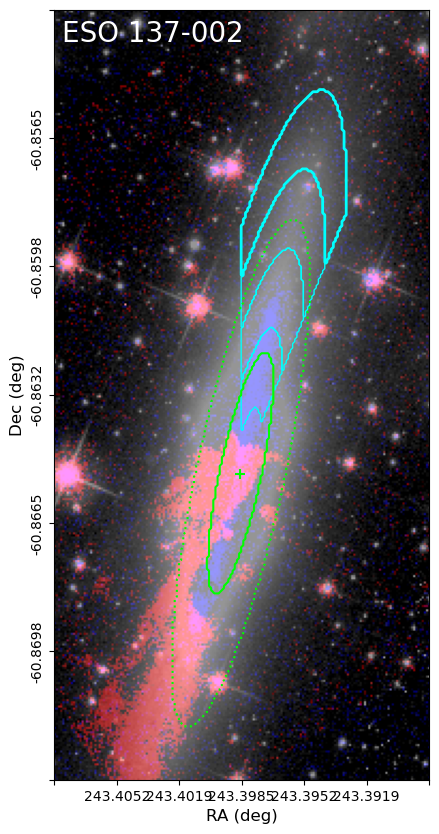

In [61]:
galaxy.make_false_color(
    bands=['muse_Ha','hst_acs_f814w','hst_wfc3_uvis_f275w'], #'galex_nuv'], #'spitzer_irac_1'],
    colors={
        'hst_acs_f814w': (1,1,1),  # stellar continuum in white
        'muse_Ha':  (1,0,0),              # Hα in red
        'hst_wfc3_uvis_f275w':(0,0,1),              # UV in blue
        'spitzer_irac_1': (0,1,0),
    },
    scale_lims={
        'hst_acs_f814w': (30,95),  # adjust as needed to show stellar disc
        'muse_Ha':  (70,90),              # tweak to highlight Hα tails
        'hst_wfc3_uvis_f275w':(70,99),             # highlight star-forming regions
        'spitzer_irac_1': (80,95),
    },
    stretch={
        'hst_acs_f814w': 'log',  # smooth stellar light
        'muse_Ha':'asinh',                  # stretch faint Hα emission
        'hst_wfc3_uvis_f275w':'asinh',                # stretch faint UV
        'spitzer_irac_1': 'asinh',
    },
    gamma=1.3
)

for i in range(3):
    regions_for_mcspf[i].plot_aesthetic(color='cyan',linewidth=1,caption_fontsize=10)
ellipses[0].plot_aesthetic(color='lime',linewidth=1.5,linestyle='-',caption_fontsize=10)
ellipses[1].plot_aesthetic(color='lime',linewidth=1.5,caption_fontsize=10)

p = Point(coords=(ra_center,dec_center),caption='',caption_fontsize=12,caption_offset=[0.02,0.03],color='lime',)

galaxy.plot_false_color(
    rgb_image='rgb',
    ra_min = ra_center-0.01,
    ra_max = ra_center+0.01,
    dec_min = dec_center-0.008,
    dec_max = dec_center+0.012,
    regions=regions_for_mcspf+ellipses,
    title='ESO 137-002',
    title_loc=(0.02,0.95),
    title_fontsize=20,
    points=[p],
    show_region_captions=False,
)

In [64]:
bands = ['galex_nuv','hst_wfc3_uvis_f275w','hst_acs_f475w','hst_acs_f814w','hst_wfc3_ir_f160w',
                     'herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um']

phot_list = []
for i in range(4):
    phot = galaxy.photometry(regions_for_mcspf[i],background_exclude_regions=[ellipses[-1]],print_output=True,bands = bands)
    phot_list.append(phot)


GALEX NUV
Total flux: 0.25611, poisson unc: 0.04169, sky flux: 0.07012, sky std: 0.03194840831799845
	Flux = 0.02732 ± 0.00794 mJy, SNR = 3.44
HST WFC3 UVIS F275W
Total flux: 67.85862, poisson unc: 0.14767, sky flux: 1.78658, sky std: 3.5344579443953545
	Flux = 0.14753 ± 0.00963 mJy, SNR = 15.32
HST ACS F475W
Total flux: 7288.95877, poisson unc: 2.04903, sky flux: 33.93899, sky std: 56.87583580393359
	Flux = 1.87760 ± 0.04853 mJy, SNR = 38.69
HST ACS F814W
Total flux: 19414.99899, poisson unc: 5.33326, sky flux: 130.16963, sky std: 172.3988804708875
	Flux = 4.00622 ± 0.07109 mJy, SNR = 56.36
HST WFC3 IR F160W
Total flux: 43262.20592, poisson unc: 7.24044, sky flux: 1403.41726, sky std: 532.598883292136
	Flux = 7.04414 ± 0.11694 mJy, SNR = 60.24
Herschel PACS 70 μm
Total flux: 0.02341, poisson unc: 0.00000, sky flux: 0.00006, sky std: 0.0005325595342609243
	Flux = 23.35471 ± 0.53256 mJy, SNR = 43.85
Herschel PACS 100 μm
Total flux: 0.04523, poisson unc: 0.00000, sky flux: 0.00007, sky s

In [65]:
for i in range(4):
    phot_list[i].to_fits(f'../DATA/Norma/ESO137_002/ESO137002_region{i+1:.0f}.phot')
    

In [66]:
spectra = galaxy.cubes.muse.extract_spectra(regions=regions_for_mcspf,pangal_object=galaxy)

In [67]:
for i,spec in enumerate(spectra):
    spec.header['REDSHIFT'] = z_true
    spec.to_fits(f'../DATA/Norma/ESO137_002/muse_spectrum_region_{i+1:.0f}.spec')

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize, LogNorm

import glob
import sys, os
sys.path.append(os.path.expanduser('~/Desktop/Pangal'))

#from pangal.pfitter import PFitter
from pangal.photometry_table import PhotometryTable

from pangal.pfitter import PFitter
from pangal.run import Run
#from build_boissier import load_spectrum_models_from_fits

import warnings
warnings.simplefilter("ignore")

In [3]:
phot = []
for i in range(4):
    phot.append(PhotometryTable().from_fits(f'../DATA/Norma/ESO137_002/ESO137002_region{i+1:.0f}.phot'))

for i in range(4):
    phot[i].header["id"] = i+1


In [4]:
from pangal.photometry_table import PhotometryCatalog
PhotometryCatalog(phot).print()

,1,2,3,4
galex_nuv,0.027 ± 0.008 (3.4),0.024 ± 0.011 (2.2),0.023 ± 0.013 (1.8),0.010 ± nan (nan)
hst_wfc3_uvis_f275w,0.148 ± 0.010 (15.3),0.064 ± 0.014 (4.5),0.025 ± 0.021 (1.2),0.030 ± nan (nan)
hst_acs_f475w,1.878 ± 0.049 (38.7),1.245 ± 0.041 (30.5),0.872 ± 0.044 (19.7),0.344 ± 0.054 (6.3)
hst_acs_f814w,4.006 ± 0.071 (56.4),2.830 ± 0.076 (37.3),2.035 ± 0.098 (20.8),0.905 ± 0.127 (7.1)
hst_wfc3_ir_f160w,7.044 ± 0.117 (60.2),4.879 ± 0.176 (27.7),3.119 ± 0.220 (14.2),1.541 ± 0.305 (5.1)
herschel_pacs_70um,23.355 ± 0.533 (43.9),0.881 ± 0.979 (0.9),0.300 ± 1.150 (0.3),1.366 ± 1.366 (1.0)
herschel_pacs_100um,45.154 ± 0.475 (95.1),3.939 ± 0.893 (4.4),0.977 ± 1.277 (0.8),1.392 ± 1.392 (1.0)
herschel_pacs_160um,16.486 ± 0.165 (100.0),8.377 ± 0.336 (25.0),2.769 ± 0.789 (3.5),1.033 ± 1.033 (1.0)


In [5]:
from pangal.spectrum import Spectrum
spectra = []
for i in range(4):
    spectra.append(Spectrum().from_fits(f'../DATA/Norma/ESO137_002/muse_spectrum_region_{i+1}.spec'))

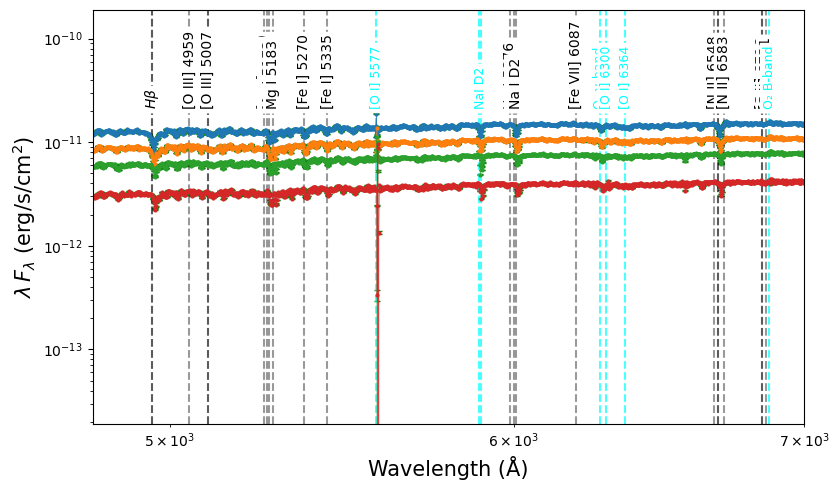

In [13]:
Spectrum().plot(figsize=(10,5),spectra=spectra, per_wavelength=True, phot=phot[0], #show_phot_legend=True,
              winf=4800,wsup=7000, 
                #ymin=5e-13, ymax= 1.5e-11, 
                #y_units='mJy',
                show_all_spectral_lines=True,show_top_spectral_lines=True,
                show_atmospheric_lines=True,show_spec_legend=False)

In [9]:


fitter = PFitter(model_file='../big_galaxies_models.fits',
                 burst_model_file='../burst_models.fits',
             model_pars=['V_DISC','R_GAL','TRUNCAGE','TRUNCTAU','METAL'], 
             burst_model_pars=['BURSTAGE'],
             uv_bump = False,
             leitatt = False,
            )



Initializing PFitter object
Loading models from  ../big_galaxies_models.fits
Burst component: loading models from  ../burst_models.fits
 Pre-computed model grid:
   - V_DISC: 5 values, min=130.0, max=210.0
   - R_GAL: 8 values, min=2.0, max=16.0
   - TRUNCAGE: 19 values, min=4.0, max=2000.0
   - TRUNCTAU: 19 values, min=4.0, max=1000.0
   - METAL: 1 values, min=0.017, max=0.017
   - BURSTAGE: 510 values, min=2.0, max=3000.0
Dust attenuation curve from Calzetti 2000.
Loading nebular lines templates from nebular_Byler_mist_2018.lines
Emission line metallicity requested 0.017, found 0.0200
Tabulated gas ages (Myr): [ 0.5  1.   2.   3.   4.   5.   6.   7.  10. ]
Tabulated ionization grid: [-4.  -3.5 -3.  -2.5 -2.  -1.5 -1. ]
Loading of nebular lines templates completed.
Tabulated alpha values from 'alpha_dh02.dat': [0.0625 0.125  0.1875 0.25   0.3125 0.375  0.4375 0.5    0.5625 0.625
 0.6875 0.75   0.8125 0.875  0.9375 1.     1.0625 1.125  1.1875 1.25
 1.3125 1.375  1.4375 1.5    1.5625 1.

In [8]:
phot[0].data.keys()

dict_keys(['galex_nuv', 'hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w', 'herschel_pacs_70um', 'herschel_pacs_100um', 'herschel_pacs_160um'])

In [7]:
bands = ['hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w', 'herschel_pacs_70um', 'herschel_pacs_100um', 'herschel_pacs_160um']

custom_prior = {
    'av':     {'type':'uniform', 'low':0.0,    'high':0.2},
    #'alpha':  {'type':'uniform', 'low':1.5,    'high':3},
    'log_m_star':  {'type':'uniform', 'low':8.0,    'high':9.7},
    #'burst_mass_fraction': {'type':'uniform', 'low':1e-9,    'high':0.2},
    #'sigma_vel': {'type':'uniform', 'low':0,    'high':400},
    #'vel_sys': {'type':'uniform', 'low':-500,    'high':+500},
    #'TRUNCTAU': {'type':'uniform', 'low':50,    'high':500},
    'fesc': {'type':'uniform', 'low':-0.01,    'high':0.01},
    'R_GAL': {'type':'uniform', 'low':2,    'high':4},
    'V_DISC': {'type':'uniform', 'low':150,    'high':200},
    
}

res = fitter.run_fit(phot=phot[0], 
                                 spec=spectra[0],
                                 spectral_range=[4800,7000],
                                 treat_as_upper_limits=['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
                     fix_pars={'redshift':0.018983,'luminosity_distance':67.8,}, #'ion_gas':-3.94,'age_gas':13,'f_esc':1,'burst_mass_fraction':0
                     bands=bands,
                     nlive=500,
                     dlogz=0.01,
                     custom_priors=custom_prior,
                     )    

res.save('../DATA/Norma/ESO137_002/dynesty_runs/REGION_1_allfree.npz')


Using the following photometric filters: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Setting as upper limits: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Fixed parameter: redshift = 0.018983
Fixed parameter: luminosity_distance = 67.8
Fitting:  V_DISC
Fitting:  R_GAL
Fitting:  TRUNCAGE
Fitting:  TRUNCTAU
Fitting:  METAL
Fitting:  burst_mass_fraction
Fitting:  fesc
Fitting:  ion_gas
Fitting:  age_gas
Fitting:  av
Fitting:  av_ext
Fitting:  alpha
Fitting:  log_m_star
Fitting:  vel_sys
Fitting:  sigma_vel
Fitting:  sigma_gas
Fitting:  spec_noise_scale

Priors:
  - V_DISC: Uniform(150, 200)
  - R_GAL: Uniform(2, 4)
  - TRUNCAGE: Uniform(4.0, 2000.0)
  - TRUNCTAU: Uniform(4.0, 1000.0)
  - METAL: Uniform(0.017, 0.017)
  - burst_mass_fraction: Uniform(0, 1.0)
  - fesc: Uniform(-0.01, 0.01)
  - ion_gas: Uniform(-4.0, -1.0)

27866it [1:22:16,  5.64it/s, +500 | bound: 350 | nc: 1 | ncall: 981815 | eff(%):  2.891 | loglstar:   -inf < 61459.837 <    inf | logz: 61408.762 +/-    nan | dlogz:  0.000 >  0.010]


Saved fit results to ../DATA/Norma/ESO137_002/dynesty_runs/REGION_1_allfree.npz


In [8]:
bands = ['hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w', 'herschel_pacs_70um', 'herschel_pacs_100um', 'herschel_pacs_160um']

custom_prior = {
    'av':     {'type':'uniform', 'low':0.0,    'high':0.2},
    #'alpha':  {'type':'uniform', 'low':1.5,    'high':3},
    'log_m_star':  {'type':'uniform', 'low':8.0,    'high':9.7},
    #'burst_mass_fraction': {'type':'uniform', 'low':1e-9,    'high':0.2},
    #'sigma_vel': {'type':'uniform', 'low':0,    'high':400},
    #'vel_sys': {'type':'uniform', 'low':-500,    'high':+500},
    #'TRUNCTAU': {'type':'uniform', 'low':50,    'high':500},
    'fesc': {'type':'uniform', 'low':-0.01,    'high':0.01},
    'R_GAL': {'type':'uniform', 'low':4,    'high':7},
    'V_DISC': {'type':'uniform', 'low':150,    'high':200},
    
}

res = fitter.run_fit(phot=phot[1], 
                                 spec=spectra[1],
                                 spectral_range=[4800,7000],
                                 treat_as_upper_limits=['hst_wfc3_uvis_f275w','herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
                     fix_pars={'redshift':0.018983,'luminosity_distance':67.8,}, #'ion_gas':-3.94,'age_gas':13,'f_esc':1,'burst_mass_fraction':0
                     bands=bands,
                     nlive=500,
                     dlogz=0.01,
                     custom_priors=custom_prior,
                     )    

res.save('../DATA/Norma/ESO137_002/dynesty_runs/REGION_2_allfree.npz')


Using the following photometric filters: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Setting as upper limits: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Fixed parameter: redshift = 0.018983
Fixed parameter: luminosity_distance = 67.8
Fitting:  V_DISC
Fitting:  R_GAL
Fitting:  TRUNCAGE
Fitting:  TRUNCTAU
Fitting:  METAL
Fitting:  burst_mass_fraction
Fitting:  fesc
Fitting:  ion_gas
Fitting:  age_gas
Fitting:  av
Fitting:  av_ext
Fitting:  alpha
Fitting:  log_m_star
Fitting:  vel_sys
Fitting:  sigma_vel
Fitting:  sigma_gas
Fitting:  spec_noise_scale

Priors:
  - V_DISC: Uniform(150, 200)
  - R_GAL: Uniform(4, 7)
  - TRUNCAGE: Uniform(4.0, 2000.0)
  - TRUNCTAU: Uniform(4.0, 1000.0)
  - METAL: Uniform(0.017, 0.017)
  - burst_mass_fraction: Uniform(0, 1.0)
  - fesc: Uniform(-0.01, 0.01)
  - ion_gas: Uniform(-4.0, -1.0)

30285it [1:33:56,  5.37it/s, +500 | bound: 386 | nc: 1 | ncall: 1078225 | eff(%):  2.856 | loglstar:   -inf < 62028.534 <    inf | logz: 61972.440 +/-    nan | dlogz:  0.000 >  0.010]


Saved fit results to ../DATA/Norma/ESO137_002/dynesty_runs/REGION_2_allfree.npz


In [10]:
bands = ['hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w', 'herschel_pacs_70um', 'herschel_pacs_100um', 'herschel_pacs_160um']

custom_prior = {
    'av':     {'type':'uniform', 'low':0.0,    'high':0.2},
    #'alpha':  {'type':'uniform', 'low':1.5,    'high':3},
    'log_m_star':  {'type':'uniform', 'low':8.0,    'high':9.7},
    #'burst_mass_fraction': {'type':'uniform', 'low':1e-9,    'high':0.2},
    #'sigma_vel': {'type':'uniform', 'low':0,    'high':400},
    #'vel_sys': {'type':'uniform', 'low':-500,    'high':+500},
    #'TRUNCTAU': {'type':'uniform', 'low':50,    'high':500},
    'fesc': {'type':'uniform', 'low':-0.01,    'high':0.01},
    'R_GAL': {'type':'uniform', 'low':9.5,    'high':14},
    'V_DISC': {'type':'uniform', 'low':150,    'high':200},
    
}

res = fitter.run_fit(phot=phot[3], 
                                 spec=spectra[3],
                                 spectral_range=[4800,7000],
                                 treat_as_upper_limits=['hst_wfc3_uvis_f275w','herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
                     fix_pars={'redshift':0.018983,'luminosity_distance':67.8,}, #'ion_gas':-3.94,'age_gas':13,'f_esc':1,'burst_mass_fraction':0
                     bands=bands,
                     nlive=500,
                     dlogz=0.01,
                     custom_priors=custom_prior,
                     )    

res.save('../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_allfree.npz')


Using the following photometric filters: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Setting as upper limits: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Fixed parameter: redshift = 0.018983
Fixed parameter: luminosity_distance = 67.8
Fitting:  V_DISC
Fitting:  R_GAL
Fitting:  TRUNCAGE
Fitting:  TRUNCTAU
Fitting:  METAL
Fitting:  burst_mass_fraction
Fitting:  fesc
Fitting:  ion_gas
Fitting:  age_gas
Fitting:  av
Fitting:  av_ext
Fitting:  alpha
Fitting:  log_m_star
Fitting:  vel_sys
Fitting:  sigma_vel
Fitting:  sigma_gas
Fitting:  spec_noise_scale

Priors:
  - V_DISC: Uniform(150, 200)
  - R_GAL: Uniform(9.5, 14)
  - TRUNCAGE: Uniform(4.0, 2000.0)
  - TRUNCTAU: Uniform(4.0, 1000.0)
  - METAL: Uniform(0.017, 0.017)
  - burst_mass_fraction: Uniform(0, 1.0)
  - fesc: Uniform(-0.01, 0.01)
  - ion_gas: Uniform(-4.0, -1

21199it [1:03:32,  5.56it/s, +500 | bound: 262 | nc: 1 | ncall: 742460 | eff(%):  2.925 | loglstar:   -inf < 62773.205 <    inf | logz: 62735.052 +/-    nan | dlogz:  0.000 >  0.010]


Saved fit results to ../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_allfree.npz


In [6]:
bands = ['hst_wfc3_uvis_f275w', 'hst_acs_f475w', 'hst_acs_f814w', 'hst_wfc3_ir_f160w', 'herschel_pacs_70um', 'herschel_pacs_100um', 'herschel_pacs_160um']

custom_prior = {
    'av':     {'type':'uniform', 'low':0.0,    'high':0.2},
    #'alpha':  {'type':'uniform', 'low':1.5,    'high':3},
    'log_m_star':  {'type':'uniform', 'low':8.0,    'high':9.7},
    #'burst_mass_fraction': {'type':'uniform', 'low':1e-9,    'high':0.2},
    #'sigma_vel': {'type':'uniform', 'low':0,    'high':400},
    #'vel_sys': {'type':'uniform', 'low':-500,    'high':+500},
    #'TRUNCTAU': {'type':'uniform', 'low':50,    'high':500},
    'fesc': {'type':'uniform', 'low':-0.01,    'high':0.01},
    'R_GAL': {'type':'uniform', 'low':9.5,    'high':14},
    'V_DISC': {'type':'uniform', 'low':150,    'high':200},
    
}

res = fitter.run_fit(phot=phot[3], 
                                 spec=spectra[3],
                                 spectral_range=[4800,7000],
                                 treat_as_upper_limits=['hst_wfc3_uvis_f275w','herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
                     fix_pars={'redshift':0.018983,'luminosity_distance':67.8,'burst_mass_fraction':0}, #'ion_gas':-3.94,'age_gas':13,'f_esc':1,'burst_mass_fraction':0
                     bands=bands,
                     nlive=500,
                     dlogz=0.01,
                     custom_priors=custom_prior,
                     )    

res.save('../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_noBURST.npz')


Using the following photometric filters: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Setting as upper limits: hst_wfc3_uvis_f275w, hst_acs_f475w, hst_acs_f814w, hst_wfc3_ir_f160w, herschel_pacs_70um, herschel_pacs_100um, herschel_pacs_160um
Fixed parameter: redshift = 0.018983
Fixed parameter: luminosity_distance = 67.8
Fixed parameter: burst_mass_fraction = 0
Fitting:  V_DISC
Fitting:  R_GAL
Fitting:  TRUNCAGE
Fitting:  TRUNCTAU
Fitting:  METAL
Fitting:  fesc
Fitting:  ion_gas
Fitting:  age_gas
Fitting:  av
Fitting:  av_ext
Fitting:  alpha
Fitting:  log_m_star
Fitting:  vel_sys
Fitting:  sigma_vel
Fitting:  sigma_gas
Fitting:  spec_noise_scale

Priors:
  - V_DISC: Uniform(150, 200)
  - R_GAL: Uniform(9.5, 14)
  - TRUNCAGE: Uniform(4.0, 2000.0)
  - TRUNCTAU: Uniform(4.0, 1000.0)
  - METAL: Uniform(0.017, 0.017)
  - fesc: Uniform(-0.01, 0.01)
  - ion_gas: Uniform(-4.0, -1.0)
  - age_gas: Uniform(0.5, 

22167it [1:07:04,  5.51it/s, +500 | bound: 276 | nc: 1 | ncall: 758287 | eff(%):  2.991 | loglstar:   -inf < 62753.363 <    inf | logz: 62713.367 +/-    nan | dlogz:  0.000 >  0.010]


Saved fit results to ../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_noBURST.npz


In [7]:
reg_1_nob = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_1_noBURST.npz')
reg_2_nob = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_2_noBURST.npz')
reg_3_nob = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_3_noBURST.npz')
reg_4_nob = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_noBURST.npz')

reg_1_allfree = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_1_allfree.npz')
reg_2_allfree = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_2_allfree.npz')
reg_3_allfree = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_3_allfree.npz')
reg_4_allfree = Run().load('../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_allfree.npz')

Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_1_noBURST.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_2_noBURST.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_3_noBURST.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_noBURST.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_1_allfree.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_2_allfree.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_3_allfree.npz
Loaded fit results from ../DATA/Norma/ESO137_002/dynesty_runs/REGION_4_allfree.npz


# No burst

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 2, 'high': 4}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


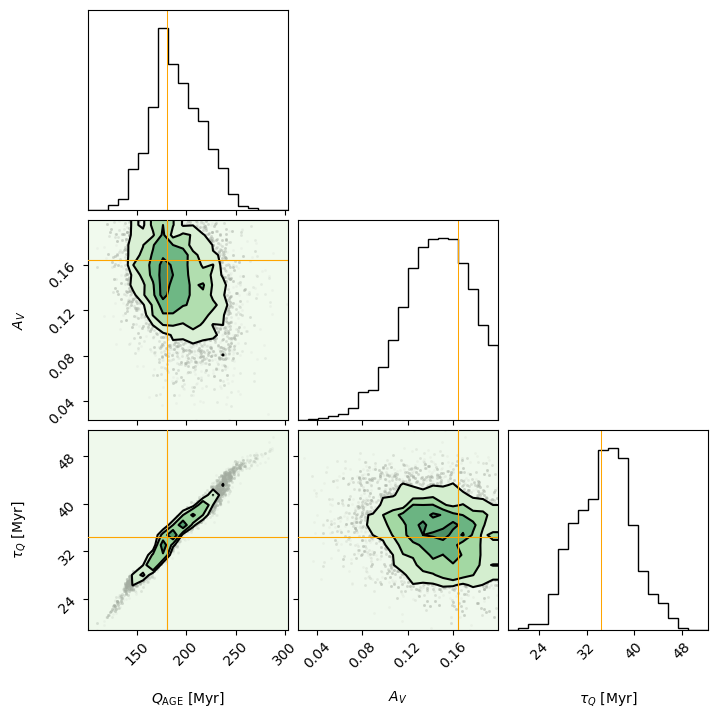

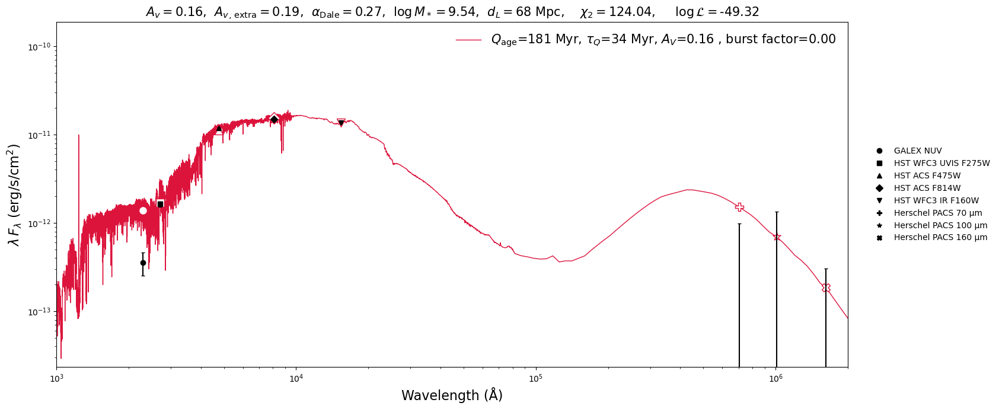

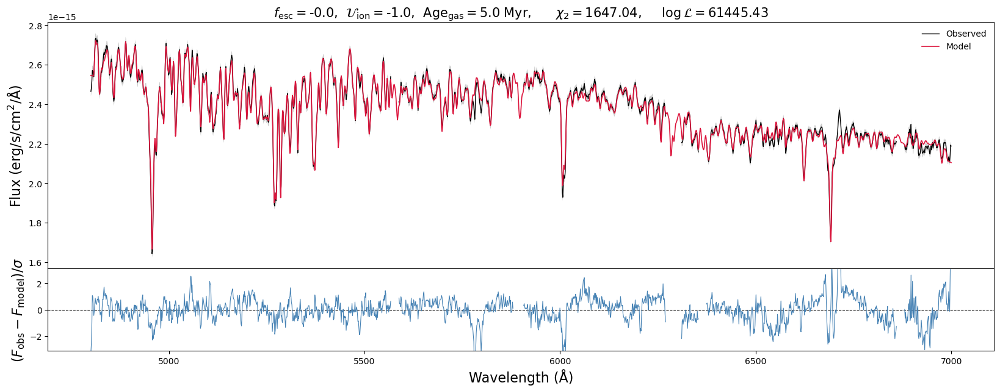

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 4, 'high': 7}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


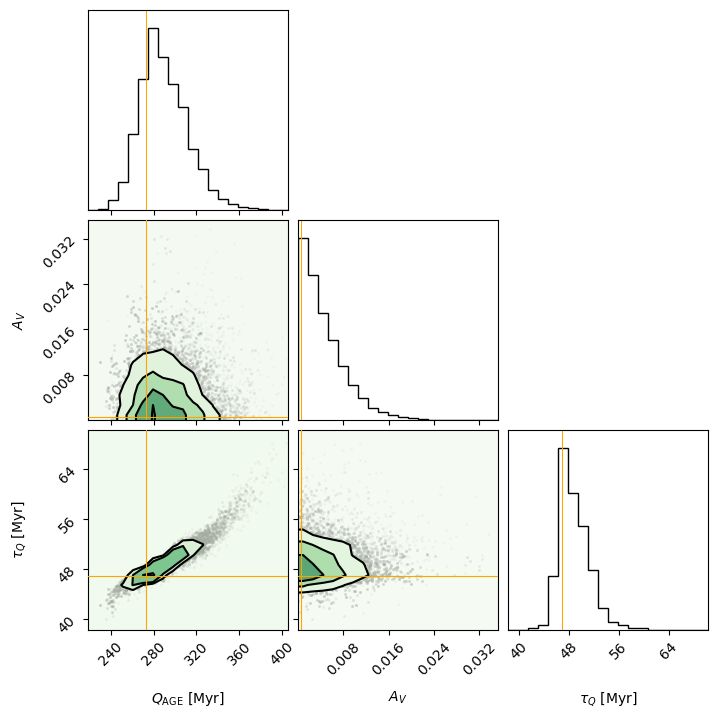

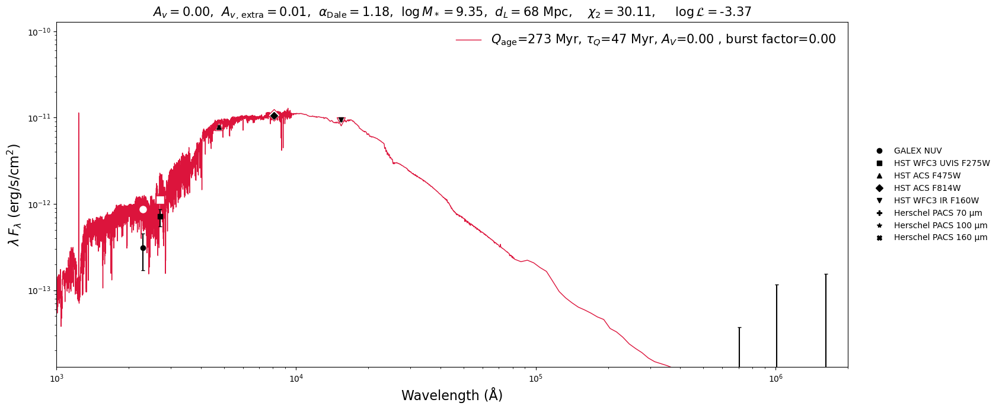

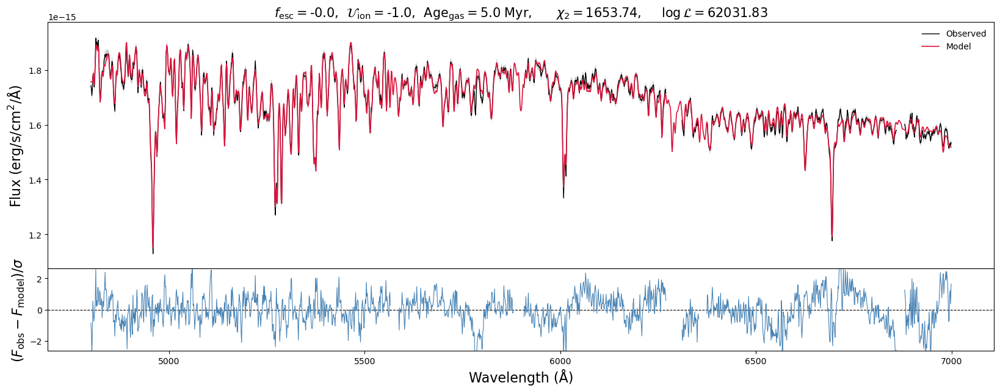

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 7, 'high': 9.5}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


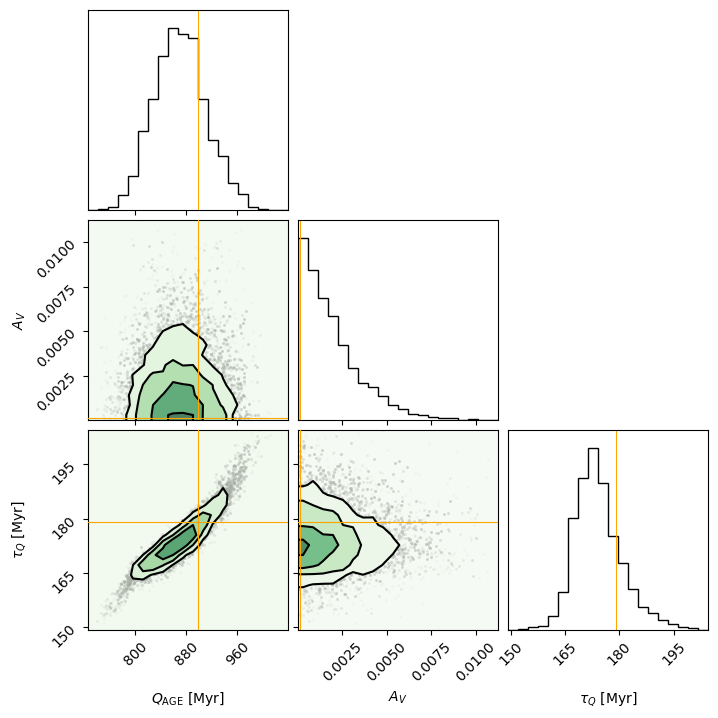

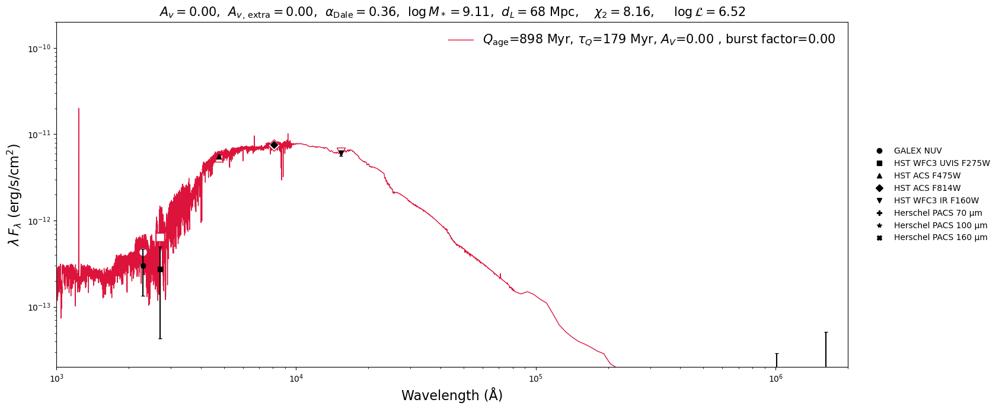

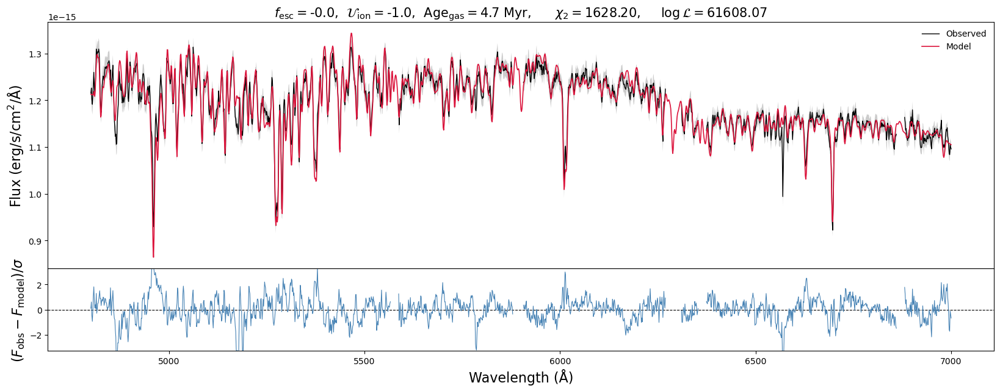

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 9.5, 'high': 14}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


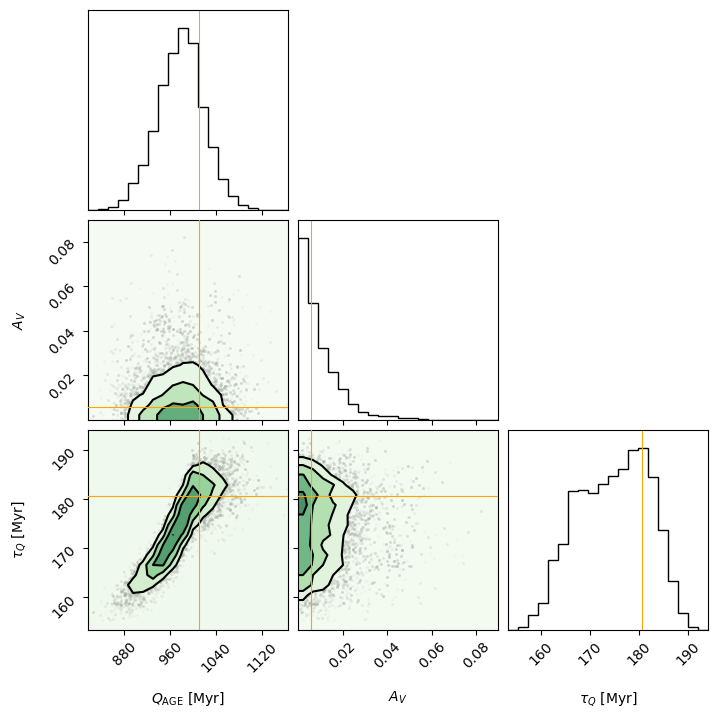

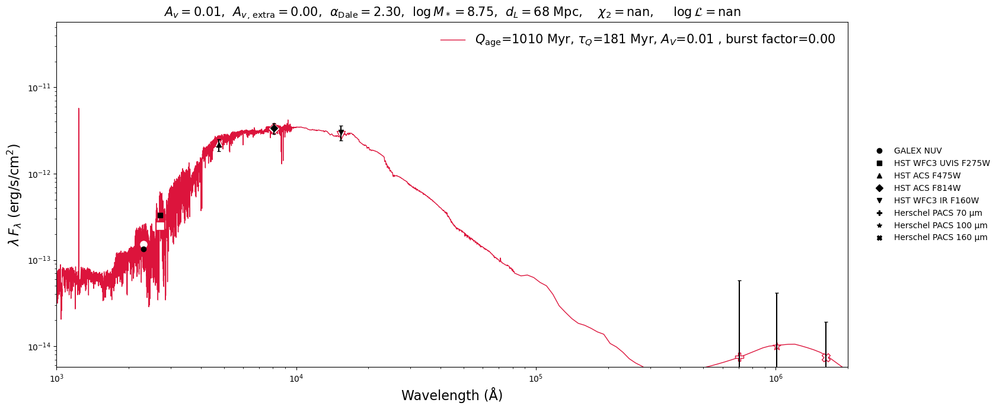

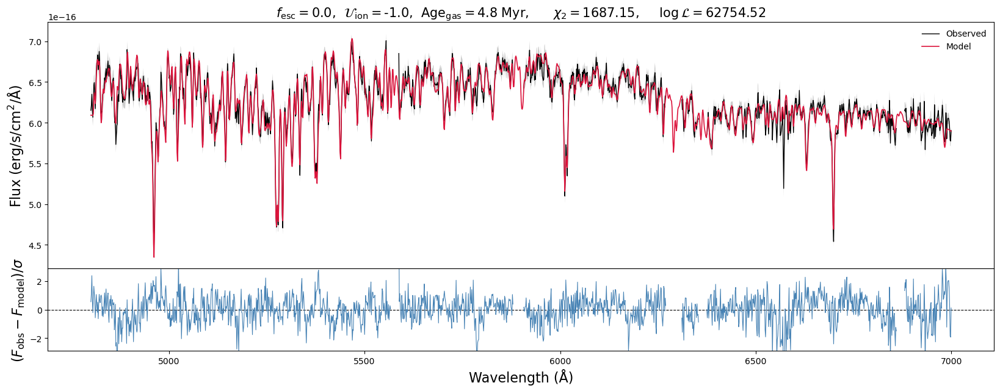

In [10]:
results = [reg_1_nob,reg_2_nob, reg_3_nob,reg_4_nob]

for i,res in enumerate(results):

    print(res.custom_priors)
    
    
    parameters_for_cornerplot = ['TRUNCAGE','av','TRUNCTAU']
    res.cornerplot(parameters=parameters_for_cornerplot,
                          cmap='Greens',
                          show_stats=False,
                          show_histograms=True,
                          mark_point='maxlogl',
                          mark_lw=0.75,
                          mark_color='orange')
    
    params = res.best_model()
    
    spec_legend_pars = {
        'TRUNCAGE': dict(label="$Q_\\text{age}$", unit="Myr", fmt=".0f"),
        'TRUNCTAU': dict(label="$\\tau_Q$", unit="Myr", fmt=".0f"),
        'AV':    dict(label="$A_V$", unit="", fmt=".2f"),
        'BURSTF':    dict(label="burst factor", unit="", fmt=".2f"),
    }
    
    fitter.fit_diagnostic(
            params=params,
            spec=spectra[i],
            spectral_range=[4800,7000],
            polydeg=7,
            phot=phot[i],
            color='crimson',
            treat_as_upper_limits=['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
            #winf_spec=5500,wsup_spec=5700,
            winf_phot=1e3,wsup_phot=2e6,
            spec_legend_pars=spec_legend_pars,
            spec_legend_fontsize=15,
            title_fontsize=15,
            title_color='black',
            label_fontsize=16,
        )

# With burst

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 2, 'high': 4}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


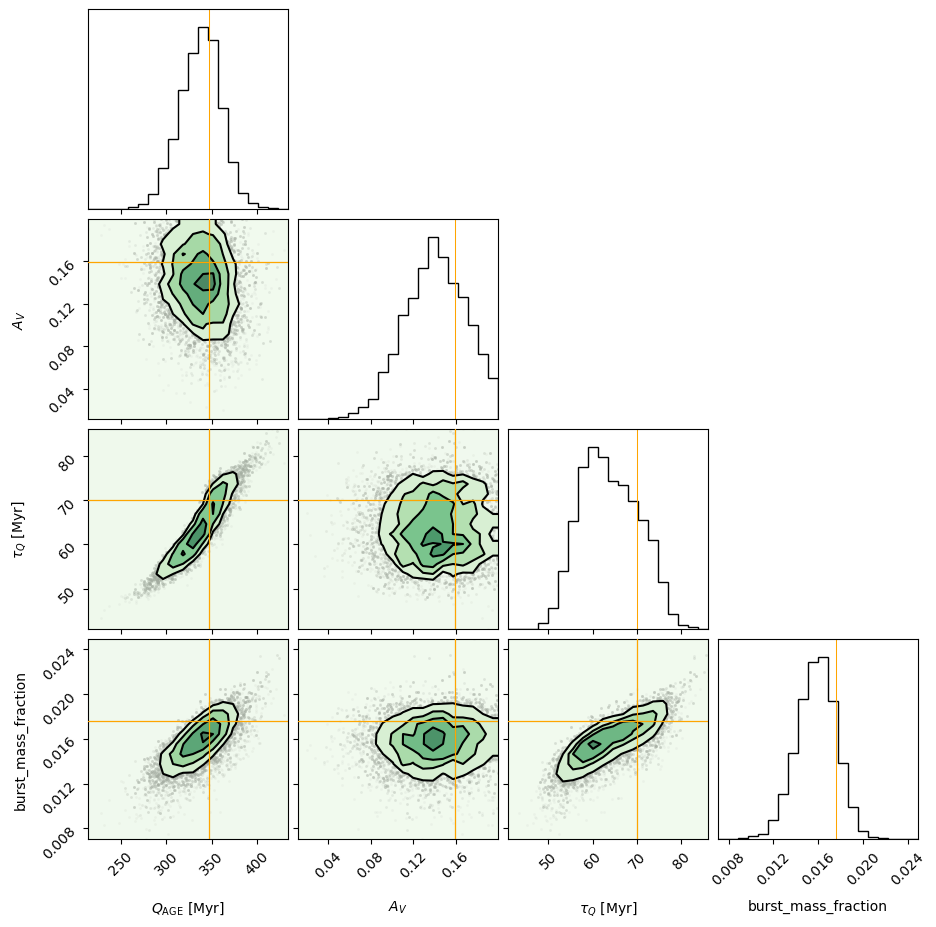

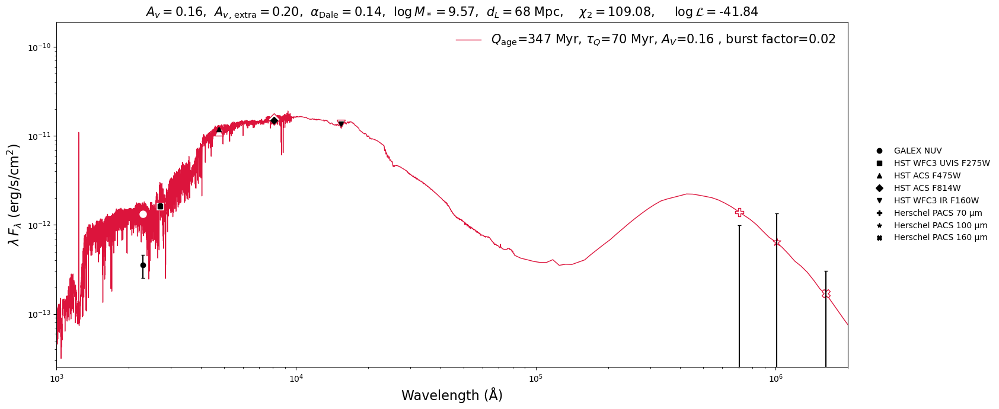

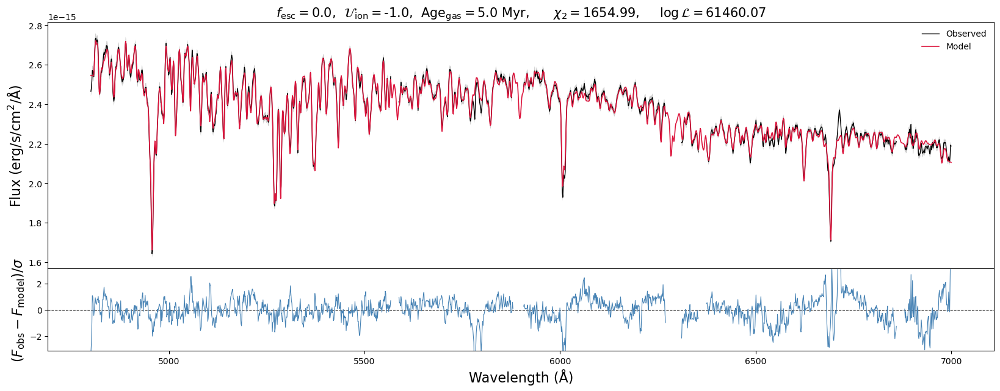

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 4, 'high': 7}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


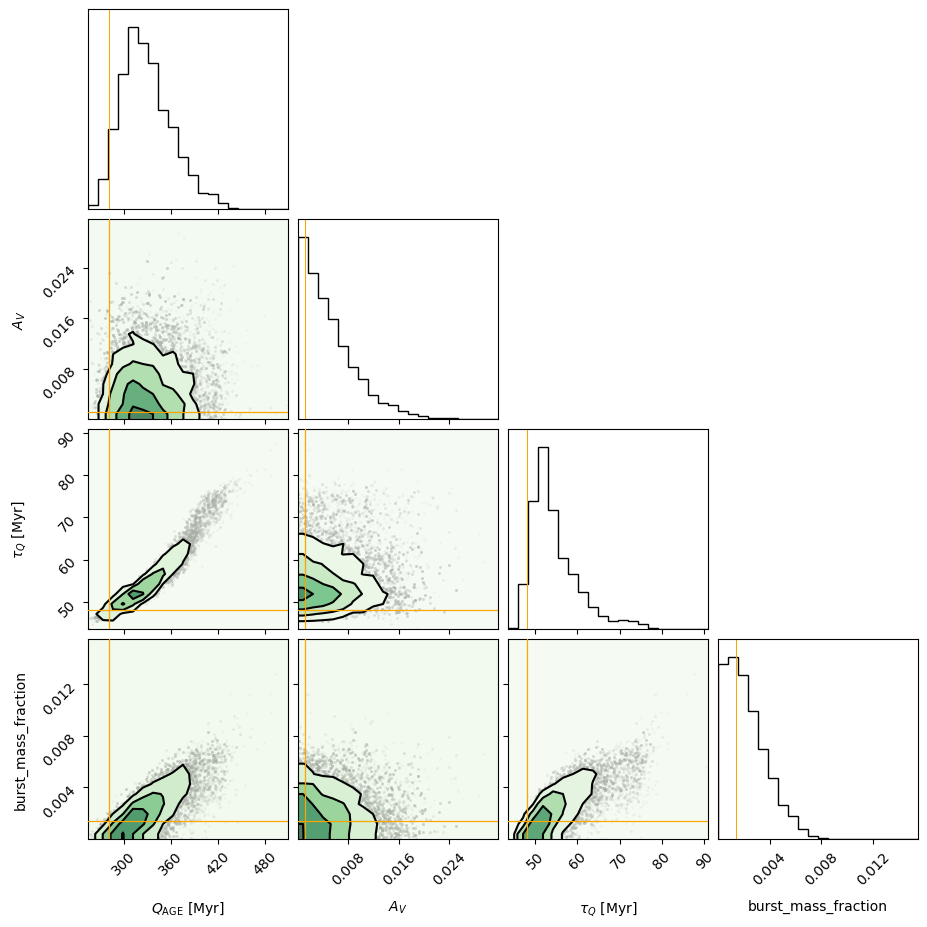

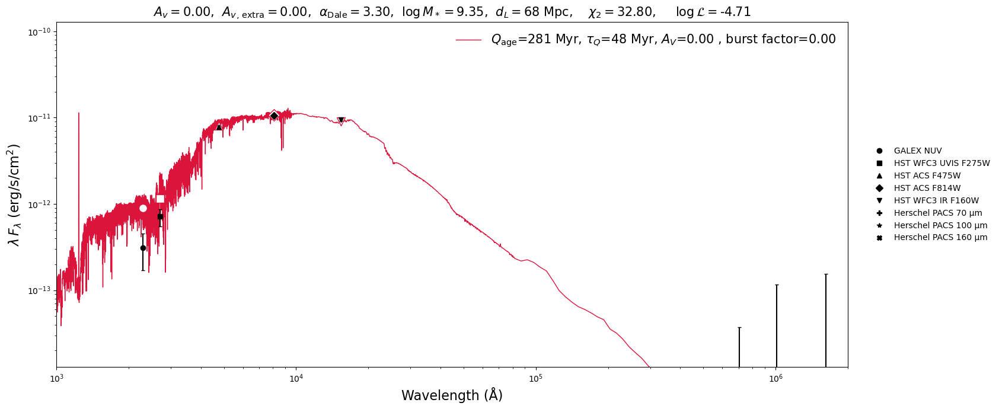

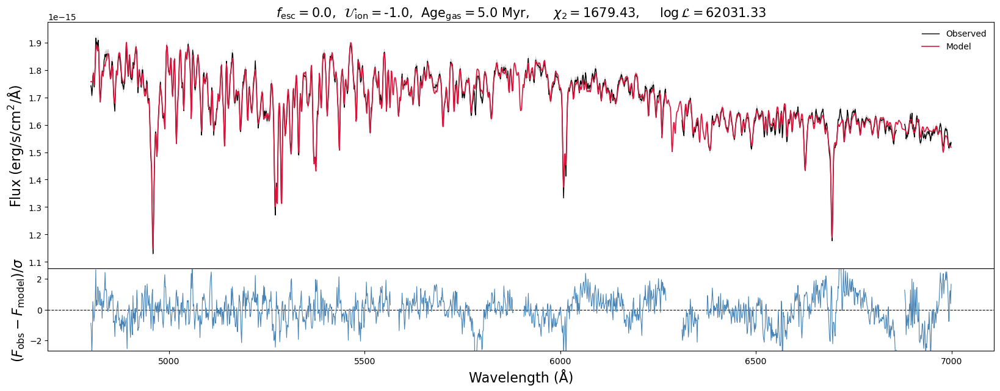

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 7, 'high': 9.5}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


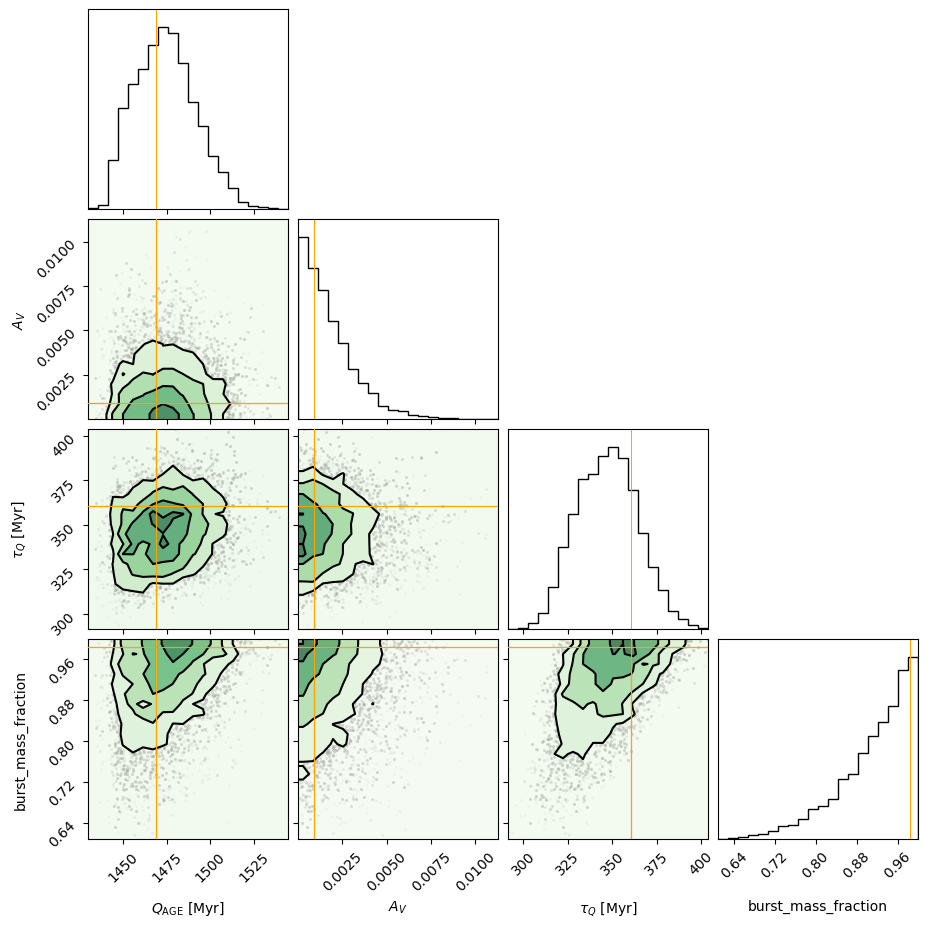

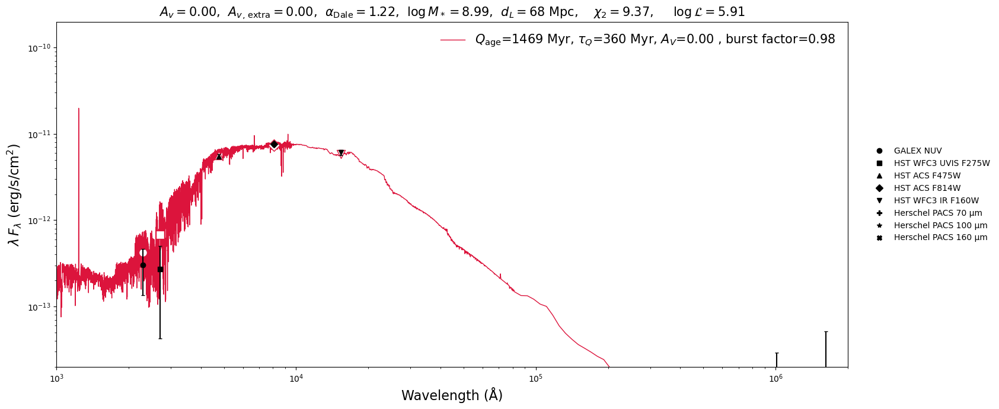

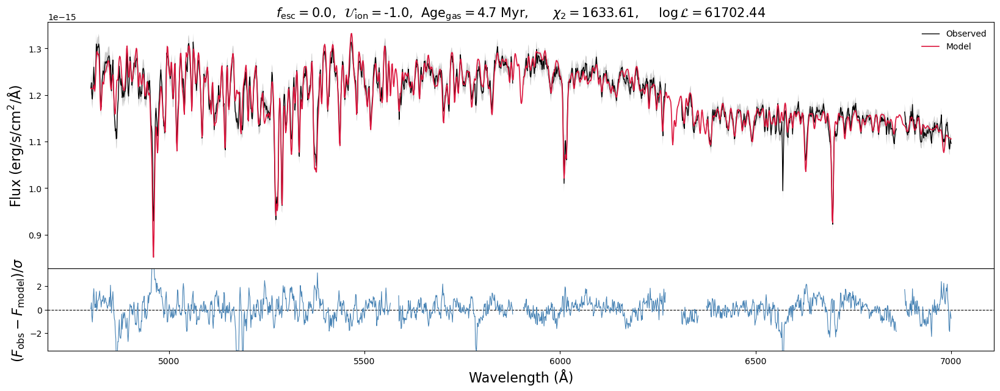

{'av': {'type': 'uniform', 'low': 0.0, 'high': 0.2}, 'log_m_star': {'type': 'uniform', 'low': 8.0, 'high': 9.7}, 'fesc': {'type': 'uniform', 'low': -0.01, 'high': 0.01}, 'R_GAL': {'type': 'uniform', 'low': 9.5, 'high': 14}, 'V_DISC': {'type': 'uniform', 'low': 150, 'high': 200}}


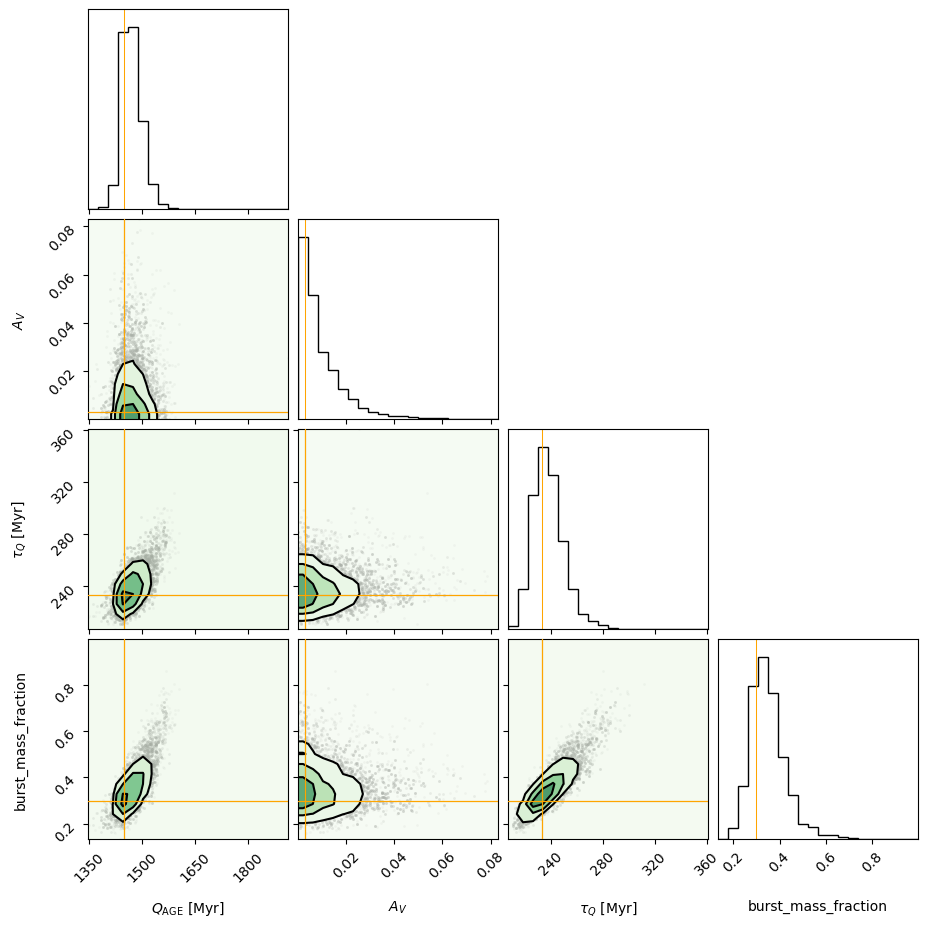

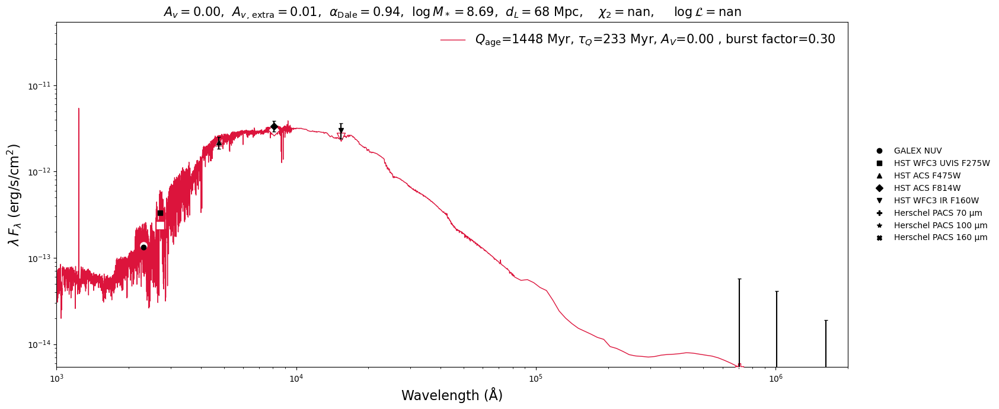

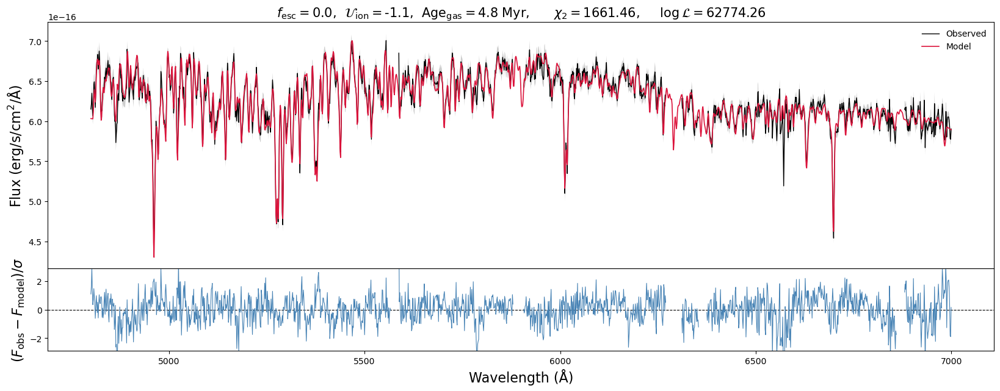

In [11]:
results = [reg_1_allfree,reg_2_allfree, reg_3_allfree,reg_4_allfree]

for i,res in enumerate(results):

    print(res.custom_priors)
    
    
    parameters_for_cornerplot = ['TRUNCAGE','av','TRUNCTAU','burst_mass_fraction']
    res.cornerplot(parameters=parameters_for_cornerplot,
                          cmap='Greens',
                          show_stats=False,
                          show_histograms=True,
                          mark_point='maxlogl',
                          mark_lw=0.75,
                          mark_color='orange')
    
    params = res.best_model()
    
    spec_legend_pars = {
        'TRUNCAGE': dict(label="$Q_\\text{age}$", unit="Myr", fmt=".0f"),
        'TRUNCTAU': dict(label="$\\tau_Q$", unit="Myr", fmt=".0f"),
        'AV':    dict(label="$A_V$", unit="", fmt=".2f"),
        'BURSTF':    dict(label="burst factor", unit="", fmt=".2f"),
    }
    
    fitter.fit_diagnostic(
            params=params,
            spec=spectra[i],
            spectral_range=[4800,7000],
            polydeg=7,
            phot=phot[i],
            color='crimson',
            treat_as_upper_limits=['herschel_pacs_70um','herschel_pacs_100um','herschel_pacs_160um'],
            #winf_spec=5500,wsup_spec=5700,
            winf_phot=1e3,wsup_phot=2e6,
            spec_legend_pars=spec_legend_pars,
            spec_legend_fontsize=15,
            title_fontsize=15,
            title_color='black',
            label_fontsize=16,
        )